In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import math
import random
import cv2
import albumentations as A
import os
from tensorflow.keras.preprocessing import image
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# I’m Something of a Painter Myself

#### Overview
In this project, we will be building a GAN to capture special characteristics of one image collection, in our case Monet paintings, and figuring out how these characteristics could be translated into the other image collection and that generates 7,000 to 10,000 Monet-style images.

Generative adversarial networks (GANs) consists of at least two neural networks: a generator model and a discriminator model. The generator is a neural network that creates the images. This generator is trained using a discriminator.

The two models will work against each other, with the generator trying to trick the discriminator, and the discriminator trying to accurately classify the real vs. generated images. 

In [3]:
# directories
gan_monet_contents = os.listdir("/kaggle/input/gan-getting-started")

monet_tfrec_path = os.path.join('/kaggle/input/gan-getting-started/', 'monet_tfrec')
monet_path = os.path.join('/kaggle/input/gan-getting-started/', 'monet_jpg')
photo_tfrec_path = os.path.join('/kaggle/input/gan-getting-started/', 'photo_tfrec')
photo_path = os.path.join('/kaggle/input/gan-getting-started/', 'photo_jpg')

In [4]:
feature_description = {
    'image': tf.io.FixedLenFeature([], tf.string),
}

In [5]:
def _parse_function(example_proto):
    # parse the input `tf.train.Example` proto using the feature description:
    parsed_example = tf.io.parse_single_example(example_proto, feature_description)
    
    # decode the image and reshape it:
    image = tf.io.decode_jpeg(parsed_example['image'])
    image = tf.image.resize(image, [256, 256])  # Resize to desired size
    image = (image / 127.5) - 1  # Normalize to [-1, 1]
    
    return image

In [6]:
# gathering the tfrec Monet data:
monet_dataset = tf.data.Dataset.list_files(monet_tfrec_path + '/*.tfrec')
monet_dataset = monet_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
monet_dataset = monet_dataset.map(_parse_function)

In [7]:
# gathering the tfrec Photos:
photo_dataset = tf.data.Dataset.list_files(photo_tfrec_path + '/*.tfrec')
photo_dataset = photo_dataset.interleave(tf.data.TFRecordDataset, cycle_length=4)
photo_dataset = photo_dataset.map(_parse_function)

In [8]:
buffer = 400
batch = 32
monet_dataset = monet_dataset.shuffle(buffer).batch(batch).prefetch(tf.data.AUTOTUNE)
photo_dataset = photo_dataset.shuffle(buffer).batch(batch).prefetch(tf.data.AUTOTUNE)

monet_dataset, photo_dataset

(<_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>,
 <_PrefetchDataset element_spec=TensorSpec(shape=(None, 256, 256, None), dtype=tf.float32, name=None)>)

In [9]:
def  print_folder_statistics(path):
    d_image_sizes = {}
    for image_name in os.listdir(path):
        image = cv2.imread(os.path.join(path, image_name))
        d_image_sizes[image.shape] = d_image_sizes.get(image.shape, 0) + 1
    for size, count in d_image_sizes.items():
        print(f"shape: {size} \tcount: {count}")
        
print("Monet images:")
print(" ")
print_folder_statistics(monet_path)
print(" ")
print("-" * 10)
print(" ")
print("Photo images:")
print(" ")
print_folder_statistics(photo_path)

Monet images:
 
shape: (256, 256, 3) 	count: 300
 
----------
 
Photo images:
 
shape: (256, 256, 3) 	count: 7038


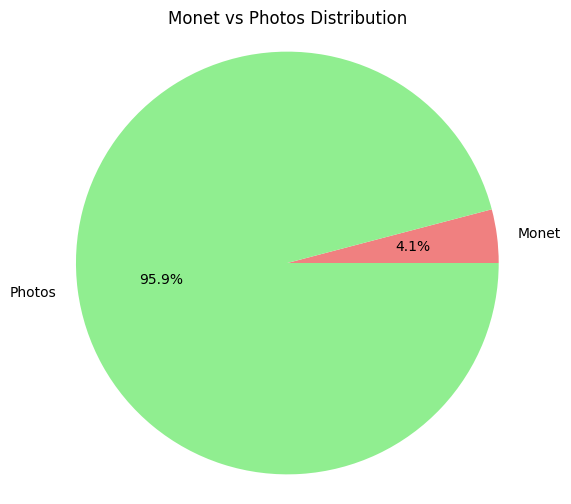

In [10]:
counts = [300, 7038]
# pie chart
plt.figure(figsize=(6, 6))
plt.pie(counts, labels=['Monet', 'Photos'], autopct='%1.1f%%', colors=['lightcoral', 'lightgreen'])
plt.title('Monet vs Photos Distribution')
plt.axis('equal')
plt.show()

### Exploratory Data Analysis

We can see that there are 300 Monet images and 7,038 photographs in our dataset. There are a lot more photgraphs than Monet paintings but it should not affect the GAN model much.

Below, we will be looking at how we can transform these images, their color composition, and how we can edit the images.

In [11]:
def batch_visualization(path, n_images, is_random=True, figsize=(16, 16)):
    plt.figure(figsize=figsize)
    
    w = int(n_images ** .5)
    h = math.ceil(n_images / w)
    
    all_names = os.listdir(path)
    
    image_names = all_names[:n_images]
    if is_random:
        image_names = random.sample(all_names, n_images)
    
    for ind, image_name in enumerate(image_names):
        img = cv2.imread(os.path.join(path, image_name))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
        plt.subplot(h, w, ind + 1)
        plt.imshow(img)
        plt.axis("off")
    
    plt.show()

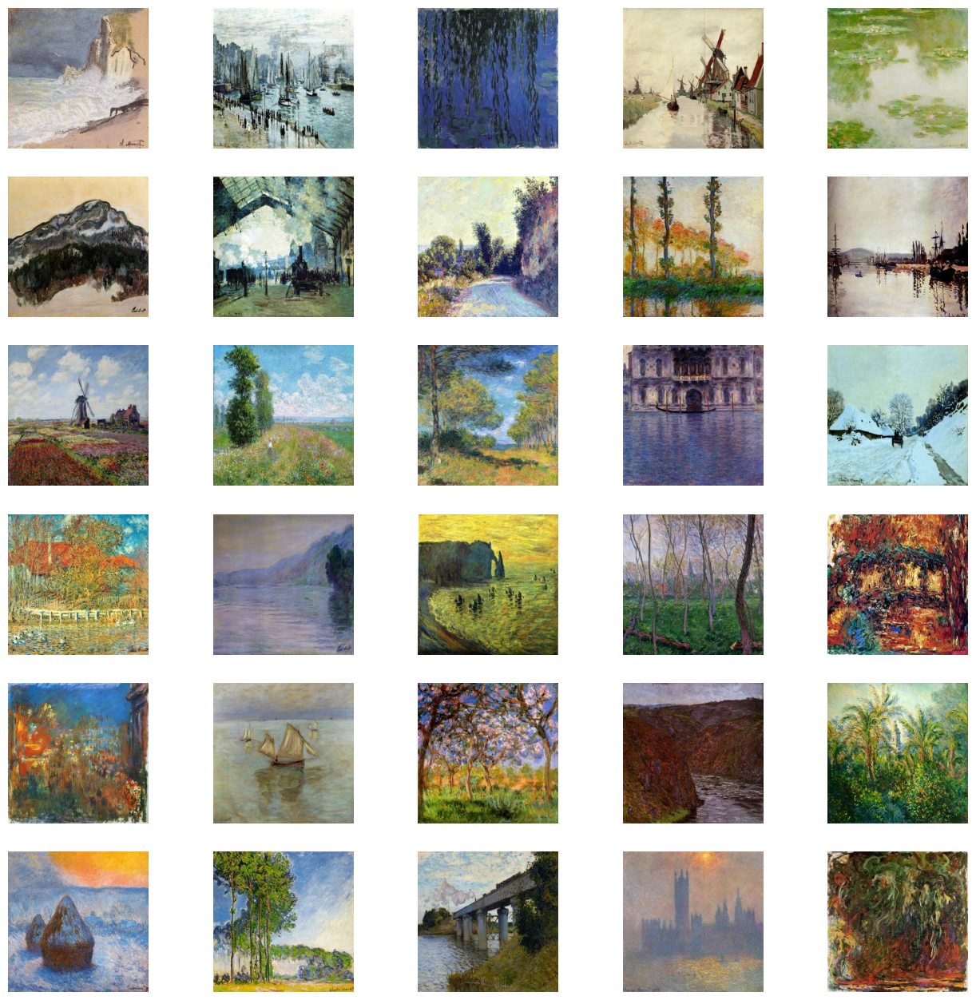

In [12]:
# lets see these of these paintings!
batch_visualization(monet_path, 30, is_random=True)

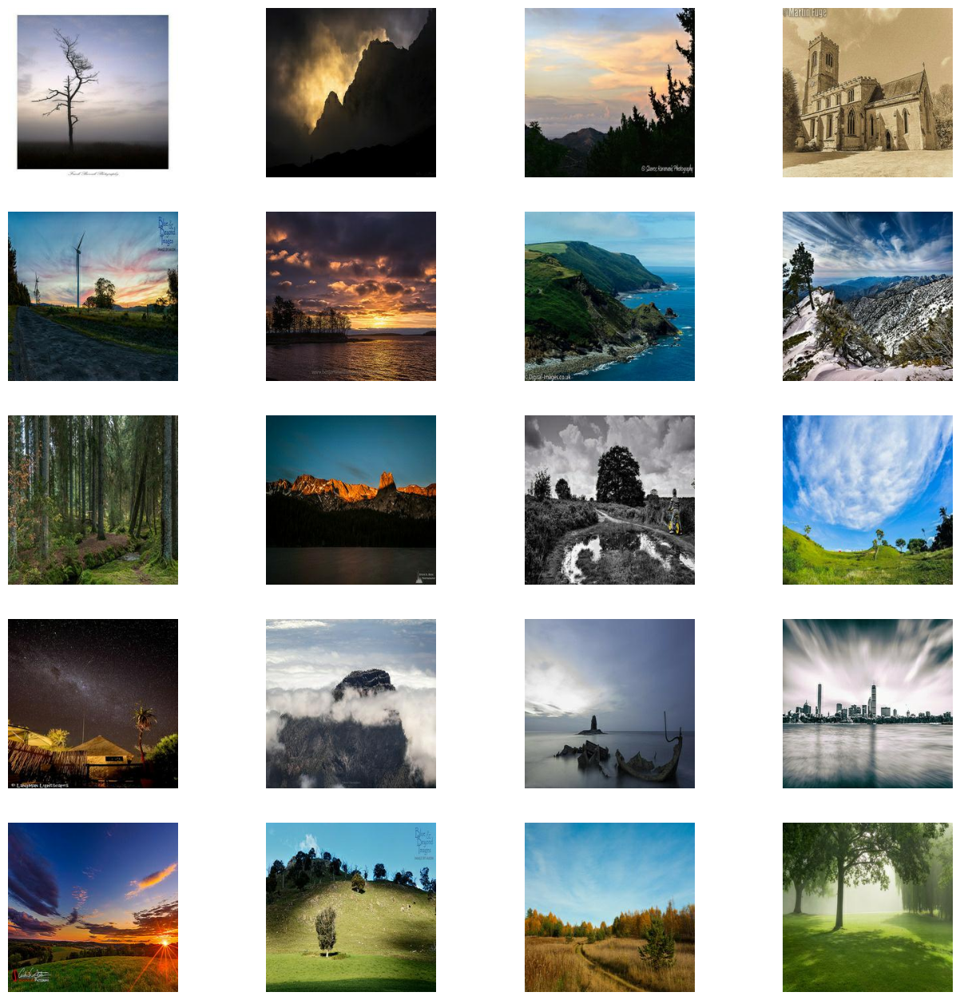

In [13]:
# now lets see some photos
batch_visualization(photo_path, 20, is_random=True)

In [14]:
# visualizing color distribution of monet paintings
def color_hist_visualization(image_path, figsize=(16, 4)):
    plt.figure(figsize=figsize)
    
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    plt.subplot(1, 4, 1)
    plt.imshow(img)
    plt.axis("off")
    
    colors = ['red', 'green', 'blue']
    for i in range(len(colors)):
        plt.subplot(1, 4, i + 2)
        plt.hist(
            img[:, :, i].reshape(-1),
            bins=25,
            alpha=0.5,
            color=colors[i],
            density=True
        )
        plt.xlim(0, 255)
        plt.xticks([])
        plt.yticks([])
    
    
    plt.show()

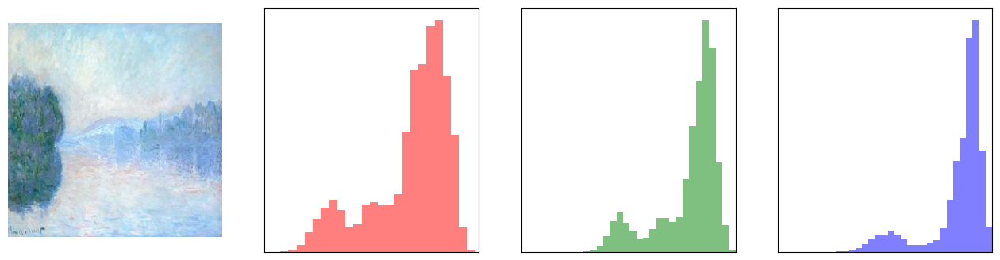

In [15]:
img_path = '../input/gan-getting-started/monet_jpg/0260d15306.jpg'
color_hist_visualization(img_path)

In [16]:
# introducing ways to transform the image
def plot_simple_augmentation(image_path, transform):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.axis("off")
    
    plt.subplot(1, 2, 2)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.show()
    
def plot_multiple_augmentation(image_path, transform):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
    
    plt.figure(figsize=(10, 10))
    
    plt.subplot(2, 2, 1)
    plt.imshow(img)
    plt.axis("off")
    
    plt.subplot(2, 2, 2)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")
    
    plt.subplot(2, 2, 3)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")
    
    plt.subplot(2, 2, 4)
    x = transform(image=img)["image"]
    plt.imshow(x)
    plt.axis("off")

    plt.show()

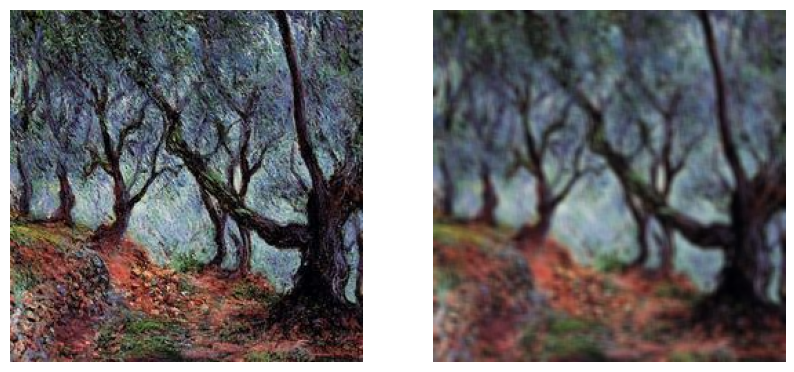

In [17]:
# blur the image
transform = A.Compose(
    [
        A.Blur(p=1.0, blur_limit=(5, 5)),
    ]
)

plot_simple_augmentation("../input/gan-getting-started/monet_jpg/011835cfbf.jpg", transform)

Now that we know what the dataset looks like, we can get started on building our model.

### Model Architecture

Our model consists of two parts: a generator and a discriminator. The generator will generate images in the style of Monet and the discriminator will attempt to classify the images as Monet or not. 

In [18]:
# Generator:
def make_generator_model():
    # reshaping the images
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    
    # encoder
    down1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    down2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(down1)
    down3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(down2)
    
    # decoder
    up1 = tf.keras.layers.Conv2DTranspose(128, (4, 4), strides=2, padding='same', activation='relu')(down3)
    up2 = tf.keras.layers.Conv2DTranspose(64, (4, 4), strides=2, padding='same', activation='relu')(up1)
    
    outputs = tf.keras.layers.Conv2DTranspose(3, (4, 4), strides=2, padding='same', activation='tanh')(up2)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)

In [19]:
# discriminator 
def make_discriminator_model():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])
    
    d1 = tf.keras.layers.Conv2D(64, (4, 4), strides=2, padding='same', activation='relu')(inputs)
    d2 = tf.keras.layers.Conv2D(128, (4, 4), strides=2, padding='same', activation='relu')(d1)
    d3 = tf.keras.layers.Conv2D(256, (4, 4), strides=2, padding='same', activation='relu')(d2)
    
    outputs = tf.keras.layers.Conv2D(1, (4, 4), padding='same')(d3)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)

We'll be using the standard GAN loss function, also known as the min-max loss. The generator tries to minimize this function while the discriminator tries to maximize it. This way, the models are always competing against each other. The Standard GAN loss function can further be categorized into two parts: Discriminator loss and Generator loss.

While the discriminator is trained, it classifies both the real data and the fake data from the generator. It penalizes itself for misclassifying a real instance as fake, or a fake instance (created by the  generator) as real.

While the generator is trained, it samples random noise and produces an output from that noise. The output then goes through the discriminator and gets classified as either “Real” or “Fake” based on the ability of the discriminator to tell one from the other. The generator loss is then calculated from the discriminator’s classification – it gets rewarded if it successfully fools the discriminator, and gets penalized otherwise. 

In [20]:
# building the loss functions
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real, generated):
    real_loss = loss_object(tf.ones_like(real), real)
    generated_loss = loss_object(tf.zeros_like(generated), generated)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss

def generator_loss(generated):
    return loss_object(tf.ones_like(generated), generated)

def calc_cycle_loss(real_image, cycled_image, LAMBDA=10):
    loss = tf.reduce_mean(tf.abs(real_image - cycled_image))
    return LAMBDA * loss

In [21]:
# define the model parameters
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)
discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.3)

generator_g = make_generator_model()
generator_f = make_generator_model()
discriminator_x = make_discriminator_model()
discriminator_y = make_discriminator_model()

@tf.function
def train_step(real_x, real_y, generator_g, generator_f, discriminator_x, discriminator_y, 
               generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer):
    with tf.GradientTape(persistent=True) as tape:
        # Generate images
        fake_y = generator_g(real_x, training=True)
        cycled_x = generator_f(fake_y, training=True)

        fake_x = generator_f(real_y, training=True)
        cycled_y = generator_g(fake_x, training=True)

        # Discriminator outputs
        disc_real_x = discriminator_x(real_x, training=True)
        disc_real_y = discriminator_y(real_y, training=True)

        disc_fake_x = discriminator_x(fake_x, training=True)
        disc_fake_y = discriminator_y(fake_y, training=True)

        # Generator losses
        gen_g_loss = generator_loss(disc_fake_y)
        gen_f_loss = generator_loss(disc_fake_x)

        # Total cycle consistency loss
        total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

        # Total generator loss
        total_gen_g_loss = gen_g_loss + total_cycle_loss
        total_gen_f_loss = gen_f_loss + total_cycle_loss

        # Discriminator losses
        disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

    # Calculate gradients and apply them
    generator_g_gradients = tape.gradient(total_gen_g_loss, generator_g.trainable_variables)
    generator_f_gradients = tape.gradient(total_gen_f_loss, generator_f.trainable_variables)

    discriminator_x_gradients = tape.gradient(disc_x_loss, discriminator_x.trainable_variables)
    discriminator_y_gradients = tape.gradient(disc_y_loss, discriminator_y.trainable_variables)

    generator_g_optimizer.apply_gradients(zip(generator_g_gradients, generator_g.trainable_variables))
    generator_f_optimizer.apply_gradients(zip(generator_f_gradients, generator_f.trainable_variables))

    discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients, discriminator_x.trainable_variables))
    discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients, discriminator_y.trainable_variables))

In [22]:
# sample of photos for visualization
sample_photos = next(iter(photo_dataset))
NUM_SAMPLES = 4

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    
    fig = plt.figure(figsize=(12, 12))
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i] + 1) / 2.0)
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

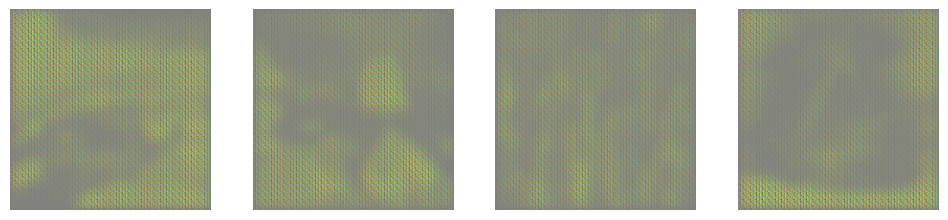

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


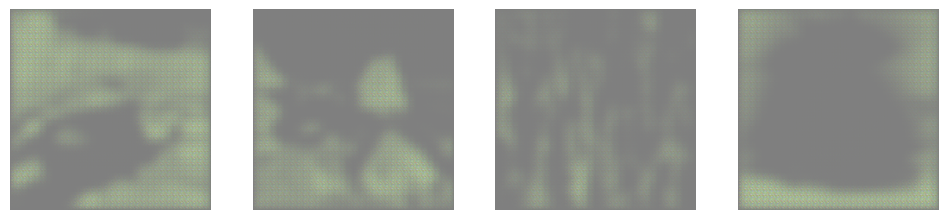

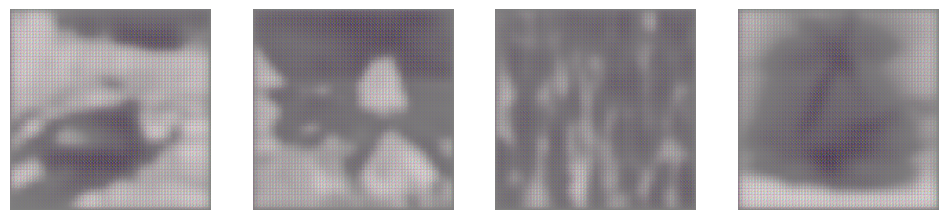

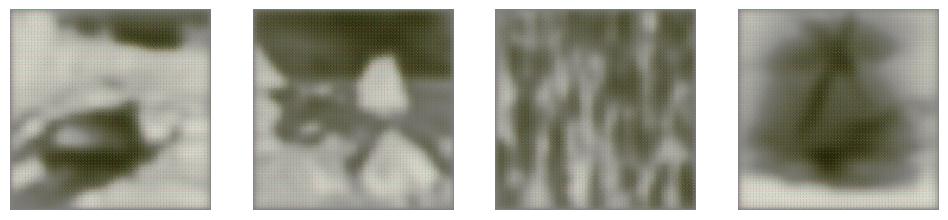

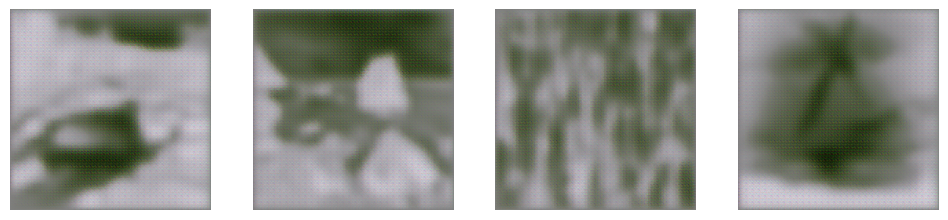

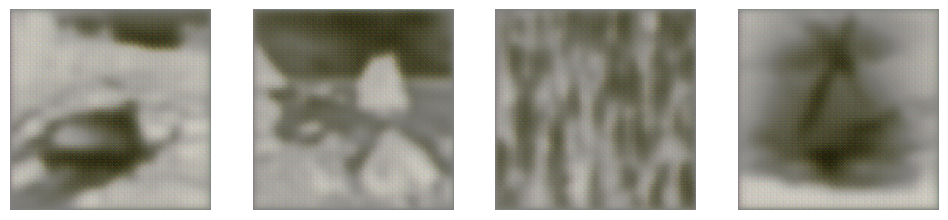

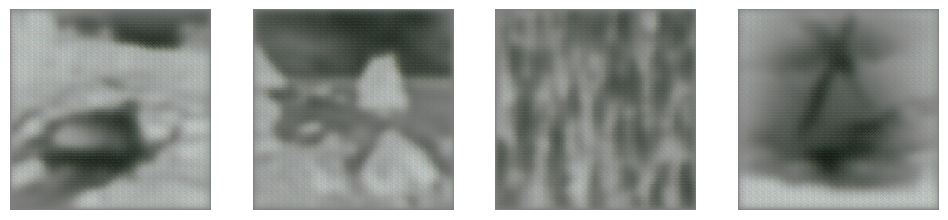

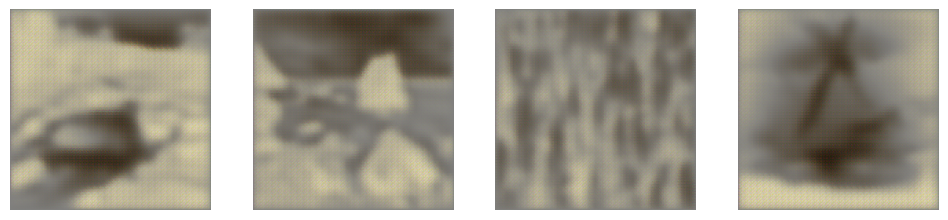

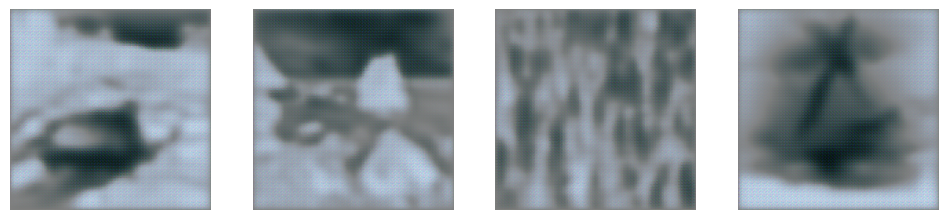

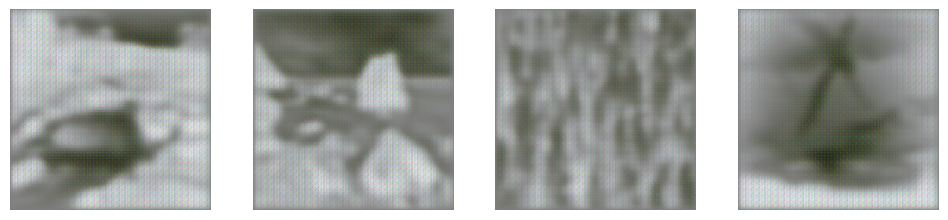

In [23]:
# lets generate some images
EPOCHS = 10
for epoch in range(EPOCHS):
    for photo, monet in tf.data.Dataset.zip((photo_dataset, monet_dataset)):
        train_step(photo, monet, generator_g, generator_f, discriminator_x, discriminator_y, 
                   generator_g_optimizer, generator_f_optimizer, discriminator_x_optimizer, discriminator_y_optimizer)
    # save generated images to visualize progress
    if epoch % 1 == 0 or epoch == EPOCHS - 1:  # save images every epochs
        generate_and_save_images(generator_g, epoch, sample_photos[:NUM_SAMPLES])
        generator_g.save('generator_g_model_{}.h5'.format(epoch))

In [29]:
generator_g = tf.keras.models.load_model('generator_g_model_9.h5')

def preprocess_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image)
    image = tf.image.resize(image, [256, 256])
    image = (tf.cast(image, tf.float32) / 127.5) - 1  # Normalize to [-1, 1]
    image = tf.expand_dims(image, 0)  # Add batch dimension
    return image

In [30]:
# now lets convert those images into monet paintings
photo_directory = '/kaggle/input/gan-getting-started/photo_jpg'
output_directory = 'converted'
os.makedirs(output_directory, exist_ok=True)

for filename in os.listdir(photo_directory):
    if filename.endswith(".jpg"):
        image_path = os.path.join(photo_directory, filename)
        input_image = preprocess_image(image_path)
        transformed_image = generator_g.predict(input_image)
        transformed_image = (transformed_image + 1) * 127.5  # denormalize to [0, 255]
        transformed_image = tf.squeeze(transformed_image).numpy().astype(np.uint8)  # Remove batch dimension and convert to uint8

        # save the transformed image
        output_path = os.path.join(output_directory, 'monet_' + filename)
        tf.keras.preprocessing.image.save_img(output_path, transformed_image)

1/1 [==============================] - 0s 70ms/step


1/1 [==============================] - 0s 187ms/step


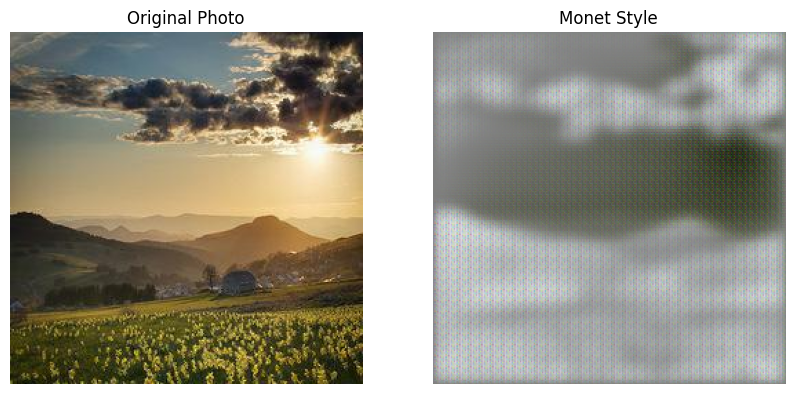

In [31]:
def preprocess_image(image_path):
    img = image.load_img(image_path, target_size=(256, 256))
    img = image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = (img / 127.5) - 1.0  # Normalize to the range [-1, 1]
    return img

generator_g = tf.keras.models.load_model('/kaggle/working/generator_g_model_9.h5')
photo_image_path = '/kaggle/input/gan-getting-started/photo_jpg/00068bc07f.jpg'
input_image = preprocess_image(photo_image_path)
transformed_image = generator_g.predict(input_image)
transformed_image = (transformed_image + 1.0) * 127.5
transformed_image = np.clip(transformed_image, 0, 255)
original_image = image.load_img(photo_image_path)
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Photo')
plt.imshow(original_image)
plt.axis('off')
plt.subplot(1, 2, 2)
plt.title('Monet Style')
plt.imshow(transformed_image[0].astype(np.uint8))
plt.axis('off')
plt.show()

In [32]:
import PIL
! mkdir ../images
    
import shutil
shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")

'/kaggle/working/images.zip'